# Manual inspection

## Essential functions

In [386]:
import pandas as pd
import torch
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
from tqdm import tqdm
from IPython.display import clear_output
import numpy as np
from typing import Literal
from transformers import AutoTokenizer
import os
from matplotlib.patheffects import withStroke
import plotly.express as px



# def plot_cm2(df, columns=['attention', 'rollout', 'attentionNorm', 'valueZeroing'], filename=None, save_legend=False):
#     plt.style.use('default')
    
#     if filename:
#         fig, ax = plt.subplots(figsize=(10, 8))
#         axes = [[ax]]
#     else:
#         fig, axes = plt.subplots(2, 2, figsize=(10, 8))
    
#     for i, column in enumerate(columns):
#         if df[f'{column}_cm_all_layers'].isna().all():
#             print(f"No data for {column}")
#             continue
        
#         mean_cueWordsCm_tensor = torch.stack(df[f'{column}_CueWordsCm_all_layers'].tolist(), dim=0).mean(dim=0)
#         mean_nonCueWordsCm_mean_tensor = torch.stack(df[f'{column}_nonCueWordsCm_mean_all_layers'].tolist(), dim=0).mean(dim=0)
#         # mean_nonCueWordsCm_max_tensor = torch.stack(df[f'{column}_nonCueWordsCm_max_all_layers'].tolist(), dim=0).mean(dim=0)
#         layers = mean_cueWordsCm_tensor.size(1)
#         num_cues = mean_cueWordsCm_tensor.size(0)
        
#         if filename:
#             current_ax = ax
#         else:
#             row = i // 2
#             col = i % 2
#             current_ax = axes[row][col]
        
#         for c in range(num_cues):
#             if c == 0:
#                 label = 'cue0-firstName'
#             elif c == 1:
#                 label = 'cue1-lastName'
#             else:
#                 label = f'Cue {c}'
#             current_ax.bar(range(1, layers + 1), mean_cueWordsCm_tensor[c, :], label=label, linewidth=1.5, edgecolor='black')

#         # current_ax.plot(range(1, layers + 1), mean_nonCueWordsCm_max_tensor, label='nonCuesMax', 
#         #                 linewidth=4, linestyle='--', color='red', marker='o', markersize=5,
#         #                 path_effects=[PathEffects.withStroke(linewidth=3, foreground='black')])
#         current_ax.plot(range(1, layers + 1), mean_nonCueWordsCm_mean_tensor, label='nonCuesMean', 
#                         linewidth=4, linestyle='--', color='blue', marker='s', markersize=5,
#                         path_effects=[PathEffects.withStroke(linewidth=3, foreground='black')])
        
#         fs = 30 if filename else 24
#         current_ax.set_xlabel('Layers', fontsize=fs)
#         current_ax.set_ylabel('Context Mixing Score', fontsize=fs)
#         # current_ax.set_title(f'{column}', fontsize=20)
#         current_ax.set_xticks(range(1, layers + 1))
#         current_ax.tick_params(axis='both', which='major', labelsize=fs-2)
#         current_ax.grid(True, linestyle='--', alpha=0.5)
#         current_ax.set_facecolor('#ffffff')

#         handles, labels = current_ax.get_legend_handles_labels()
#         fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=fs-6)
    
#     fig.patch.set_facecolor('#ffffff')
#     plt.tight_layout()
    
#     if filename:
#         if save_legend:
#             plt.savefig(filename, bbox_inches='tight', dpi=300)
#         else:
#             plt.savefig(filename)
#         plt.close()
#     else:
#         plt.show()




# def plot_cm3(df, columns=['attention', 'rollout', 'attentionNorm', 'valueZeroing'], ylim=None, filename=None, save_legend=False):
#     plt.style.use('default')
    
#     if filename:
#         fig, ax = plt.subplots(figsize=(15, 10))
#         axes = [[ax]]
#     else:
#         fig, axes = plt.subplots(2, 2, figsize=(24, 20))

#     # ylim = 0
#     # for column in columns:
#     #     mean_cueWordsCm_tensor = torch.stack(df[f'{column}_CueWordsCm_all_layers'].tolist(), dim=0).mean(dim=0)
#     #     if mean_cueWordsCm_tensor.max().item() > ylim:
#     #         ylim = mean_cueWordsCm_tensor.max().item()
    
#     for i, column in enumerate(columns):
#         if df[f'{column}_cm_all_layers'].isna().all():
#             print(f"No data for {column}")
#             continue
        
#         mean_cueWordsCm_tensor = torch.stack(df[f'{column}_CueWordsCm_all_layers'].tolist(), dim=0).mean(dim=0)
#         mean_nonCueWordsCm_mean_tensor = torch.stack(df[f'{column}_nonCueWordsCm_mean_all_layers'].tolist(), dim=0).mean(dim=0)
        
#         layers = mean_cueWordsCm_tensor.size(1)
#         num_cues = mean_cueWordsCm_tensor.size(0)
        
#         if filename:
#             current_ax = ax
#         else:
#             row = i // 2
#             col = i % 2
#             current_ax = axes[row][col]
        
#         x = np.arange(layers)
#         width = 0.7 / num_cues  # Adjust bar width based on number of cues
        
#         cue_labels = ['Cue 0 - first name', 'Cue 1 - last name'] + [f'Cue {c}' for c in range(2, num_cues)]
#         # colors = plt.cm.rainbow(np.linspace(0, 1, num_cues))
        
#         for c in range(num_cues):
#             offset = (c - num_cues/2 + 0.5) * width
#             current_ax.bar(x + offset + 1, mean_cueWordsCm_tensor[c, :], 
#                            width, label=cue_labels[c], alpha=0.8)
        
#         current_ax.plot(range(1, layers + 1), mean_nonCueWordsCm_mean_tensor, 
#                         label='nonCuesMean', linewidth=4, linestyle='--', color='black', 
#                         marker='s', markersize=5, 
#                         path_effects=[PathEffects.withStroke(linewidth=3, foreground='white')])

#         current_ax.set_xlim(0.5, layers + 0.5) 
#         if ylim:
#             current_ax.set_ylim(0, 1.1 * ylim) 
        
#         fs = 40 if filename else 20
#         current_ax.set_xlabel('Layers', fontsize=fs)
#         current_ax.set_ylabel('Context Mixing Score', fontsize=fs)
#         current_ax.set_title(f'{num_cues} cue words', fontsize=fs)
#         current_ax.set_xticks(range(1, layers + 1))
#         current_ax.tick_params(axis='both', which='major', labelsize=fs-2)
#         current_ax.grid(True, linestyle='--', alpha=0.5)
#         current_ax.set_facecolor('#ffffff')
        
#         # Set y-axis to start from 0
#         current_ax.set_ylim(bottom=0)
        
#         # Add legend to each subplot
#         current_ax.legend(loc='upper left', fontsize=fs-6, bbox_to_anchor=(0.01, 0.99), ncol=1)
    
#     fig.patch.set_facecolor('#ffffff')
#     plt.tight_layout()
    
#     if filename:
#         plt.savefig(filename, bbox_inches='tight', dpi=300)
#         plt.close()
#     else:
#         plt.show()




# def plot_cm(df, columns=['attention', 'rollout', 'attentionNorm', 'valueZeroing'], ylim=None, filename=None, save_legend=False):
#     plt.style.use('default')
    
#     if filename:
#         fig, ax = plt.subplots(figsize=(15, 10))
#         axes = [[ax]]
#     else:
#         fig, axes = plt.subplots(2, 2, figsize=(24, 20))

#     # Automatically determine ylim if not provided
#     # if ylim is None:
#     #     ylim = 0
#     #     for column in columns:
#     #         mean_cueWordsCm_tensor = torch.stack(df[f'{column}_CueWordsCm_all_layers'].tolist(), dim=0).mean(dim=0)
#     #         if mean_cueWordsCm_tensor.max().item() > ylim:
#     #             ylim = mean_cueWordsCm_tensor.max().item()
    
#     for i, column in enumerate(columns):
#         if df[f'{column}_cm_all_layers'].isna().all():
#             print(f"No data for {column}")
#             continue
        
#         mean_cueWordsCm_tensor = torch.stack(df[f'{column}_CueWordsCm_all_layers'].tolist(), dim=0).mean(dim=0)
#         mean_nonCueWordsCm_mean_tensor = torch.stack(df[f'{column}_nonCueWordsCm_mean_all_layers'].tolist(), dim=0).mean(dim=0)
        
#         layers = mean_cueWordsCm_tensor.size(1)
#         num_cues = mean_cueWordsCm_tensor.size(0)
        
#         if filename:
#             current_ax = ax
#         else:
#             row = i // 2
#             col = i % 2
#             current_ax = axes[row][col]
        
#         x = np.arange(layers)
#         cue_labels = ['Cue 0 - first name', 'Cue 1 - last name'] + [f'Cue {c}' for c in range(2, num_cues)]

#         # Plot stacked bars
#         bottom = np.zeros(layers)
#         for c in range(num_cues):
#             current_ax.bar(x + 1, mean_cueWordsCm_tensor[c, :], 
#                            width=0.7, label=cue_labels[c], bottom=bottom)
#             bottom = np.add(bottom, mean_cueWordsCm_tensor[c, :])  # Update the bottom to stack bars
        
#         # Plot the non-cue words mean as a line
#         current_ax.plot(range(1, layers + 1), mean_nonCueWordsCm_mean_tensor, 
#                         label='nonCuesMean', linewidth=4, linestyle='--', color='black', 
#                         marker='s', markersize=5, 
#                         path_effects=[withStroke(linewidth=3, foreground='white')])

#         current_ax.set_xlim(0.5, layers + 0.5) 
#         if ylim:
#             current_ax.set_ylim(0, 1.1 * ylim) 
        
#         fs = 40 if filename else 20
#         current_ax.set_xlabel('Layers', fontsize=fs)
#         current_ax.set_ylabel('Context Mixing Score', fontsize=fs)
#         current_ax.set_title(f'{num_cues} cue words', fontsize=fs)
#         current_ax.set_xticks(range(1, layers + 1))
#         current_ax.tick_params(axis='both', which='major', labelsize=fs-2)
#         current_ax.grid(True, linestyle='--', alpha=0.5)
#         current_ax.set_facecolor('#ffffff')
        
#         # Set y-axis to start from 0
#         current_ax.set_ylim(bottom=0)
        
#         # Add legend to each subplot
#         current_ax.legend(loc='upper left', fontsize=fs-6, bbox_to_anchor=(0.01, 0.99), ncol=1)
    
#     fig.patch.set_facecolor('#ffffff')
#     plt.tight_layout()
    
#     if filename:
#         plt.savefig(filename, bbox_inches='tight', dpi=300)
#         plt.close()
#     else:
#         plt.show()




# def plot_cm(df, columns=['attention', 'rollout', 'attentionNorm', 'valueZeroing'], ylim=None, filename=None, save_legend=False):
#     plt.style.use('default')
#     fs = 40 if filename else 20
    
#     if filename:
#         fig, ax = plt.subplots(figsize=(15, 10))
#         axes = [[ax]]
#     else:
#         fig, axes = plt.subplots(2, 2, figsize=(24, 20))
    
#     for i, column in enumerate(columns):
#         if df[f'{column}_cm_all_layers'].isna().all():
#             print(f"No data for {column}")
#             continue
        
#         mean_cueWordsCm_tensor = torch.stack(df[f'{column}_CueWordsCm_all_layers'].tolist(), dim=0).mean(dim=0)
#         mean_nonCueWordsCm_mean_tensor = torch.stack(df[f'{column}_nonCueWordsCm_mean_all_layers'].tolist(), dim=0).mean(dim=0)
        
#         layers = mean_cueWordsCm_tensor.size(1)
#         num_cues = mean_cueWordsCm_tensor.size(0)
        
#         if filename:
#             current_ax = ax
#         else:
#             row = i // 2
#             col = i % 2
#             current_ax = axes[row][col]
        
#         x = np.arange(layers)
#         cue_labels = ['Cue 0 - first name', 'Cue 1 - last name'] + [f'Cue {c}' for c in range(2, num_cues)]
#         # Plot stacked bars
#         bottom = np.zeros(layers)
#         for c in range(num_cues):
#             heights = mean_cueWordsCm_tensor[c, :].numpy()
#             bars = current_ax.bar(x + 1, heights, 
#                                   width=0.7, label=cue_labels[c], bottom=bottom)
            
#             # Add value labels for bars with height > 0.05
#             for j, rect in enumerate(bars):
#                 height = rect.get_height()
#                 if height > 0.03:
#                     current_ax.text(rect.get_x() + rect.get_width()/2., bottom[j] + height/2.,
#                                     f'{height:.2f}',
#                                     ha='center', va='center', rotation='vertical', fontsize=16)
            
#             bottom = np.add(bottom, heights)  # Update the bottom to stack bars
        
#         # Plot the non-cue words mean as a line
#         current_ax.plot(range(1, layers + 1), mean_nonCueWordsCm_mean_tensor, 
#                         label='nonCuesMean', linewidth=4, linestyle='--', color='black', 
#                         marker='s', markersize=5, 
#                         path_effects=[withStroke(linewidth=3, foreground='white')])
#         current_ax.set_xlim(0.5, layers + 0.5) 
#         if ylim:
#             current_ax.set_ylim(0, 1.1 * ylim) 

#         current_ax.set_xlabel('Layer', fontsize=fs)
#         current_ax.set_ylabel('Context Mixing Score', fontsize=fs)
#         current_ax.set_title(f'#Cues = {num_cues}', fontsize=fs)
#         current_ax.set_xticks(range(1, layers + 1))
#         current_ax.tick_params(axis='both', which='major', labelsize=fs-2)
#         current_ax.grid(True, linestyle='--', alpha=0.5)
#         current_ax.set_facecolor('#ffffff')
        
#         # Set y-axis to start from 0
#         current_ax.set_ylim(bottom=0)
        
#         # Add legend to each subplot
#         current_ax.legend(loc='upper left', fontsize=fs-6, bbox_to_anchor=(0.01, 0.99), ncol=1)
    
#     fig.patch.set_facecolor('#ffffff')
#     plt.tight_layout()
    
#     if filename:
#         plt.savefig(filename, bbox_inches='tight', dpi=300)
#         plt.close()
#     else:
#         plt.show()



def plot_cm(df, columns=['attention', 'rollout', 'attentionNorm', 'valueZeroing'], ylim=None, filename=None, save_legend=False, ablation=False):
    plt.style.use('default')
    fs = 40 if filename else 20
    
    if filename:
        fig, ax = plt.subplots(figsize=(15, 10))
        axes = [[ax]]
    else:
        fig, axes = plt.subplots(2, 2, figsize=(24, 20))
    
    for i, column in enumerate(columns):
        if df[f'{column}_cm_all_layers'].isna().all():
            print(f"No data for {column}")
            continue
        
        mean_cueWordsCm_tensor = torch.stack(df[f'{column}_CueWordsCm_all_layers'].tolist(), dim=0).mean(dim=0)
        mean_nonCueWordsCm_mean_tensor = torch.stack(df[f'{column}_nonCueWordsCm_mean_all_layers'].tolist(), dim=0).mean(dim=0)
        
        layers = mean_cueWordsCm_tensor.size(1)
        num_cues = mean_cueWordsCm_tensor.size(0)
        
        if filename:
            current_ax = ax
        else:
            row = i // 2
            col = i % 2
            current_ax = axes[row][col]
        
        x = np.arange(layers)
        if not ablation:
            cue_labels = ['Cue 1 - first name', 'Cue 2 - last name'] + [f'Cue {c+1}' for c in range(2, num_cues)]
        else:
            cue_labels = ['Cue 1 - he/she'] + [f'Cue {c+1}' for c in range(1, num_cues)]
        # Plot stacked bars
        bottom = np.zeros(layers)
        for c in range(num_cues):
            heights = mean_cueWordsCm_tensor[c, :].numpy()
            bars = current_ax.bar(x + 1, heights, 
                                  width=0.7, label=cue_labels[c], bottom=bottom)
            
            # Add value labels for bars with height > 0.03
            for j, rect in enumerate(bars):
                height = rect.get_height()
                if height > 0.05:
                    current_ax.text(rect.get_x() + rect.get_width()/2., bottom[j] + height/2.,
                                    f'{height:.2f}',
                                    ha='center', va='center', rotation='vertical', fontsize=18)
            
            bottom = np.add(bottom, heights)  # Update the bottom to stack bars
        
        # Plot the non-cue words mean as a line
        current_ax.plot(range(1, layers + 1), mean_nonCueWordsCm_mean_tensor, 
                        label='Others', linewidth=4, linestyle='--', color='black', 
                        marker='s', markersize=5, 
                        path_effects=[withStroke(linewidth=3, foreground='white')])
        current_ax.set_xlim(0.5, layers + 0.5) 
        if ylim:
            current_ax.set_ylim(0, 1.1 * ylim) 
        
        # Only set x-label and y-label if num_cues is 2
        current_ax.set_xlabel('Layer', fontsize=fs)
        if num_cues == 2:
            current_ax.set_ylabel('Context Mixing Score', fontsize=fs)
        else:
            current_ax.set_ylabel('')

        if not ablation:
            current_ax.set_title(f'#Cues = {num_cues}', fontsize=fs)
        else:
            current_ax.set_title(f'#Cues = {num_cues+1} - 1', fontsize=fs)
        current_ax.set_xticks(range(1, layers + 1))
        current_ax.tick_params(axis='both', which='major', labelsize=fs-2)
        current_ax.grid(True, linestyle='--', alpha=0.5)
        current_ax.set_facecolor('#ffffff')
        
        # Set y-axis to start from 0
        current_ax.set_ylim(bottom=0)
        
        # Add legend to each subplot
        current_ax.legend(loc='upper left', fontsize=fs-10, bbox_to_anchor=(0.01, 0.99), ncol=1)
    
    fig.patch.set_facecolor('#ffffff')
    plt.tight_layout()
    
    if filename:
        plt.savefig(filename, bbox_inches='tight', dpi=300)
        plt.close()
    else:
        plt.show()

# def extract_mask_tokenIdx(masked_text, tokenizer):
#     input_ids = tokenizer(masked_text)['input_ids']
#     mask_pos = (torch.tensor(input_ids) == tokenizer.mask_token_id).nonzero(as_tuple=True)[0][0].item()
#     return mask_pos




# def imshow(tensor, renderer=None, xaxis="", yaxis="", file_name=None, **kwargs):
#     fig = px.imshow(
#         tensor.detach().numpy(), 
#         color_continuous_midpoint=0.0, 
#         color_continuous_scale="RdBu", 
#         labels={"x": xaxis, "y": yaxis}, 
#         # y=[str(i) for i in range(1, 13)],
#         **kwargs
#     )
    
#     fig.show(renderer)
    
#     if file_name:
#         fig.update_layout(
#             width=2000, 
#             height=1500,
#             font=dict(size=40)
#         )
#         save_dir = '../figs/sample'
#         if not os.path.exists(save_dir):
#             os.makedirs(save_dir)

#         file_path = os.path.join(save_dir, file_name)
#         fig.write_image(file_path, format='pdf')



# def imshow(tensor, renderer=None, xaxis="", yaxis="", file_name=None, bold_indices=None, **kwargs):
#     if bold_indices is None:
#         bold_indices = []
    
#     x_labels = kwargs.get('x', [])
#     if x_labels:
#         x_labels = [f"<b>{label}</b>" if i in bold_indices else label for i, label in enumerate(x_labels)]
#         kwargs['x'] = x_labels

#     fig = px.imshow(
#         tensor.detach().numpy(), 
#         color_continuous_midpoint=0.0, 
#         color_continuous_scale="RdBu", 
#         labels={"x": xaxis, "y": yaxis}, 
#         **kwargs
#     )
    
#     fig.update_xaxes(tickangle=45)

#     # Center the title
#     fig.update_layout(
#         title={
#             'text': kwargs.get('title', ''),
#             'x': 0.5,
#             'xanchor': 'center',
#             'yanchor': 'top'
#         }
#     )

#     fig.show(renderer)
    
#     if file_name:
#         fig.update_layout(
#             width=3000, 
#             height=2000,
#             font=dict(size=50),
#             # Ensure the title remains centered when saving
#             title={
#                 'text': kwargs.get('title', ''),
#                 'x': 0.5,
#                 'xanchor': 'center',
#                 'yanchor': 'top'
#             }
#         )
#         save_dir = '../figs/sample'
#         if not os.path.exists(save_dir):
#             os.makedirs(save_dir)
#         file_path = os.path.join(save_dir, file_name)
#         fig.write_image(file_path)



def imshow(tensor, renderer=None, xaxis="", yaxis="", file_name=None, bold_indices=None, **kwargs):
    if bold_indices is None:
        bold_indices = []
    
    x_labels = kwargs.get('x', [])
    if x_labels:
        x_labels = [f"<b>{label}</b>" if i in bold_indices else label for i, label in enumerate(x_labels)]
        kwargs['x'] = x_labels

    # Create a list of y-axis labels from 1 to 12
    y_labels = list(range(1, 13))
    
    fig = px.imshow(
        tensor.detach().numpy(), 
        color_continuous_midpoint=0.0, 
        color_continuous_scale="RdBu", 
        labels={"x": xaxis, "y": yaxis}, 
        **kwargs
    )

    # Update y-axis ticks and labels
    fig.update_yaxes(
        tickmode='array',
        tickvals=list(range(len(y_labels))),
        ticktext=y_labels,
        tickfont=dict(color='black')
    )
    
    fig.update_xaxes(tickangle=45, tickfont=dict(color='black'), title_font=dict(color='black'))
    fig.update_yaxes(tickfont=dict(color='black'), title_font=dict(color='black'))
    
    # Center the title and set its color to black
    fig.update_layout(
        title={
            'text': kwargs.get('title', ''),
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': dict(color='black')
        }
    )
    fig.show(renderer)
    
    if file_name:
        fig.update_layout(
            width=3000, 
            height=2000,
            font=dict(size=50, color='black'),  # Set font color to black for saved image
            # Ensure the title remains centered when saving
            title={
                'text': kwargs.get('title', ''),
                'x': 0.5,
                'xanchor': 'center',
                'yanchor': 'top',
                'font': dict(color='black', size=50)  # Ensure title is also black in saved image
            }
        )
        save_dir = '../figs/sample'
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        file_path = os.path.join(save_dir, file_name)
        fig.write_image(file_path)




def extract_cueWords_cm(cm, cues_tokenIdxes):
    cue_words_cm = []
    num_cues = cues_tokenIdxes.shape[0]
    for c in range(num_cues):
        cue_tokens_cm = cm[:, cues_tokenIdxes[c,0]: cues_tokenIdxes[c,1]]
        cue_word_cm, _ = torch.max(cue_tokens_cm, dim=1)
        cue_words_cm.append(cue_word_cm)
    return torch.stack(cue_words_cm)



def extract_nonCueWords_stats(cm, cues_tokenIdxes, stat: Literal['mean', 'max'], mask_pos=None):
    cue_idxes = []
    for row in cues_tokenIdxes:
        cue_idxes.extend([i for i in range(row[0], row[1])])
    all_idxes = set(range(cm.size(1)))
    if mask_pos:
        NonCue_idxes = list(all_idxes - (set(cue_idxes) | set([mask_pos])))
    else:
        NonCue_idxes = list(all_idxes - set(cue_idxes))
    NonCue_words_cm = cm[:, NonCue_idxes]
    if stat == 'mean':
        return torch.mean(NonCue_words_cm, dim=1)
    elif stat == 'max':
        return torch.max(NonCue_words_cm, dim=1)[0]



def plot_relative(df_equal_preTrained, df_equal_fineTuned, model_name):
    def calculate_relative_positions(df):
        res = []
        mask_rel_poses = []
        for layer in range(12):
            layer_positions = []
            for i in range(df.shape[0]):
                max_len = df.iloc[i]['valueZeroing_cm_all_layers'][layer].size(0)
                max_cm_pos = torch.argmax(df.iloc[i]['valueZeroing_cm_all_layers'][layer]).item()
                layer_positions.append(max_cm_pos / max_len)
                if layer == 0:
                    mask_rel_poses.append(df.iloc[i]['pos4pred'] / max_len)
            res.append(np.mean(layer_positions))
        return res, np.mean(mask_rel_poses)

    res1, mask_rel_poses_mean1 = calculate_relative_positions(df_equal_preTrained)
    if df_equal_fineTuned is not None:
        res2, mask_rel_poses_mean2 = calculate_relative_positions(df_equal_fineTuned)
    
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, 13), res1, marker='o', linestyle='-', color='b', label=f'Pre-trained {model_name}')
    if df_equal_fineTuned is not None:
        plt.plot(range(1, 13), res2, marker='s', linestyle='-', color='g', label=f'Fine-tuned {model_name}')
    if model_name not in ['GPT2', 'Gemma-2b']:
        plt.axhline(mask_rel_poses_mean1, xmin=0, xmax=12, color='r', linestyle='--', label=f'Mean Mask Position: {mask_rel_poses_mean1:.2f}')
    plt.xlabel('Layer', fontsize=24)
    plt.ylabel('Average Relative Position', fontsize=24)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(loc='best', fontsize=18)
    plt.xticks(np.arange(1, 13, 1), fontsize=22)
    plt.yticks(np.arange(0, 1.1, 0.1), fontsize=22)
    plt.xlim(0, 13)
    plt.tight_layout()
    plt.savefig(f'../figs/relative_position_{model_name}.pdf')
    plt.show()

## RoBERTa

### without fine-tuning

#### Examples with 2 cues

In [ ]:
df = pd.read_pickle('../results_cm/roberta-base_gender_agreement_2.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

In [ ]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

In [ ]:
plot_cm(df_equal)

#### Examples with 4 cues

In [ ]:
df = pd.read_pickle('../results_cm/roberta-base_gender_agreement_4.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

In [ ]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

In [ ]:
plot_cm(df_equal)

#### Examples with 6 cues

In [ ]:
df = pd.read_pickle('../results_cm/roberta-base_gender_agreement_6.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

In [ ]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

In [ ]:
plot_cm2(df_equal)

In [ ]:
plot_cm(df_equal)

### with fine-tuning

#### Examples with 2 cues

In [ ]:
df = pd.read_pickle('../results_cm/finetuned-roberta_gender_agreement_2.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

In [ ]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

In [ ]:
plot_cm(df_equal)

#### Examples with 4 cues

In [ ]:
df = pd.read_pickle('../results_cm/finetuned-roberta_gender_agreement_4.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

In [ ]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

In [ ]:
plot_cm2(df_equal)

In [ ]:
plot_cm(df_equal)

#### Examples with 6 cues

In [117]:
df = pd.read_pickle('../results_cm/finetuned-roberta_gender_agreement_6.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  gary hughes is an english hard rock singer , songwriter and musician . apart from his work as a solo artist , gary hughes is the front man and main songwriter of hard rock/melodic rock band ten . <mask> has also worked as a producer and songwriter for bob catley 's first three solo albums , as well as hugo 's first album and has appeared on vinny burns ' `` the journey '' solo album and on the `` ayreonauts only '' album by the band ayreon .
CUE WORDS:  ['gary|0|4', 'hughes|5|11', 'his|82|85', 'gary|110|114', 'hughes|115|121', 'man|135|138']
TARGET WORD:  he
MODEL PREDICTION:   he
DATAFRAME #ROWS:  110


In [118]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  104
ACCURACY:  94.54545454545455 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

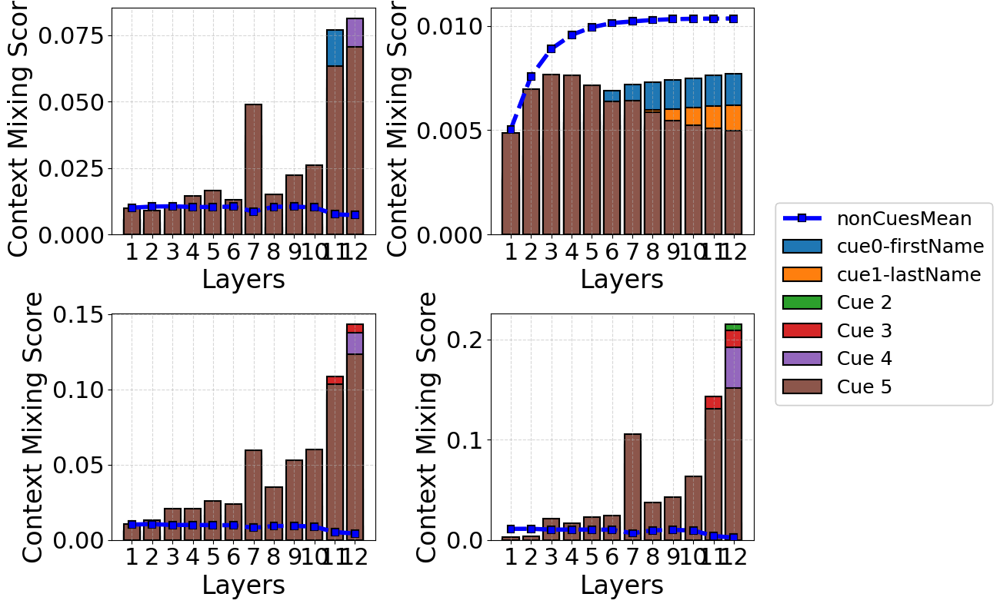

In [115]:
plot_cm2(df_equal)

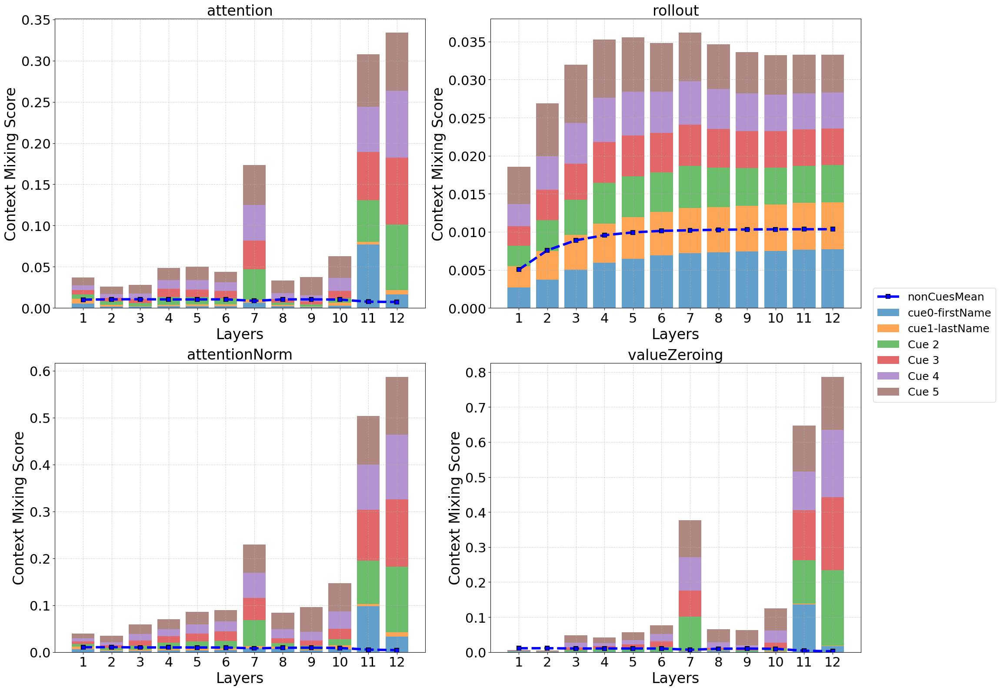

In [114]:
plot_cm(df_equal)

### Relative figure

In [ ]:
num_cues = 2

df_preTrained = pd.read_pickle(f'../results_cm/roberta-base_gender_agreement_{num_cues}.pkl')
equality_condition = (df_preTrained['target_word'] == df_preTrained['model_top1_prediction'].astype(str).str.lower()) | (' '+df_preTrained['target_word'] == df_preTrained['model_top1_prediction'].astype(str).str.lower())
df_equal_preTrained = df_preTrained.loc[equality_condition]

df_fineTuned = pd.read_pickle(f'../results_cm/finetuned-roberta_gender_agreement_{num_cues}.pkl')
equality_condition = (df_fineTuned['target_word'] == df_fineTuned['model_top1_prediction'].astype(str).str.lower()) | (' '+df_fineTuned['target_word'] == df_fineTuned['model_top1_prediction'].astype(str).str.lower())
df_equal_fineTuned = df_fineTuned.loc[equality_condition]

plot_relative(df_equal_preTrained, df_equal_fineTuned, 'RoBERTa')

## BERT

### without fine-tuning

#### Examples with 2 cues

In [373]:
df = pd.read_pickle('../results_cm/bert-base-uncased_gender_agreement_2.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  margaret becker is an american christian rock singer , guitarist , and songwriter . [MASK] has had twenty-one no. 1 christian radio hits , won four dove awards , and been nominated for four grammy awards .
CUE WORDS:  ['margaret|0|8', 'becker|9|15']
TARGET WORD:  she
MODEL PREDICTION:  she
DATAFRAME #ROWS:  190


In [374]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  175
ACCURACY:  92.10526315789474 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

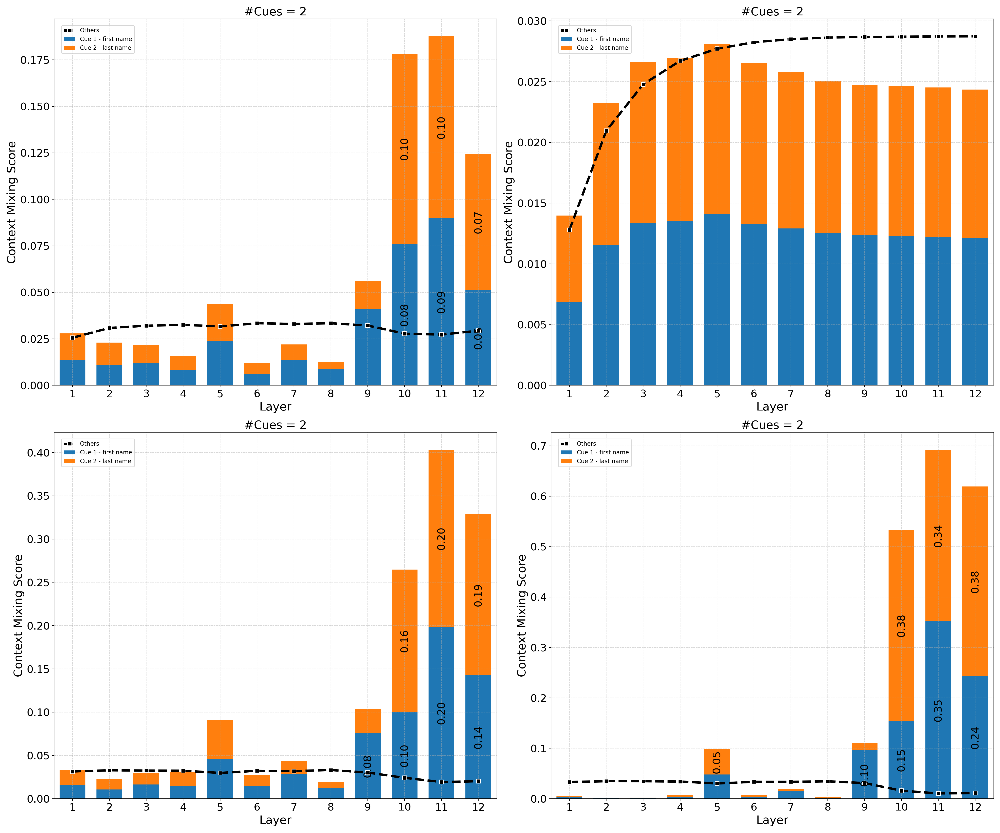

In [376]:
plot_cm(df_equal)

#### Examples with 4 cues

In [195]:
df = pd.read_pickle('../results_cm/bert-base-uncased_gender_agreement_4.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  andy pyle is an english bass guitarist . he played with the kinks from 1976 -- 1978 . prior to that , he was in blodwyn pig and savoy brown . later , [MASK] played with wishbone ash .
CUE WORDS:  ['andy|0|4', 'pyle|5|9', 'he|41|43', 'he|102|104']
TARGET WORD:  he
MODEL PREDICTION:  he
DATAFRAME #ROWS:  193


In [196]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  158
ACCURACY:  81.86528497409327 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

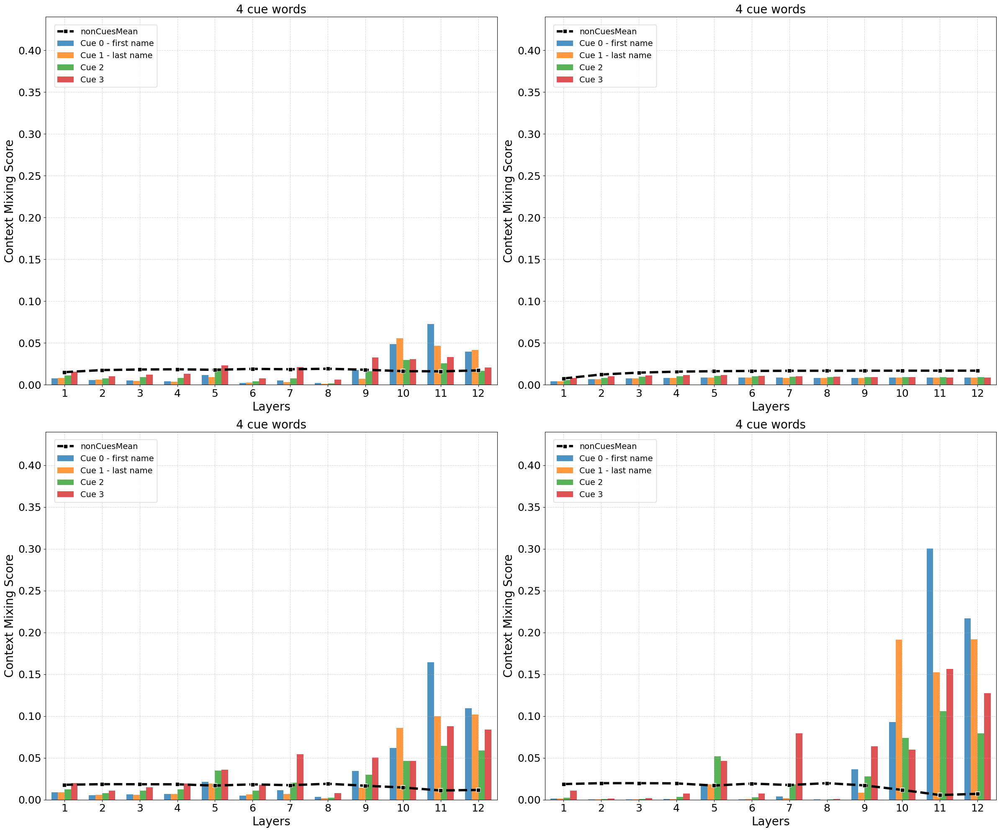

In [198]:
plot_cm(df_equal)

#### Examples with 6 cues

In [283]:
df = pd.read_pickle('../results_cm/bert-base-uncased_gender_agreement_6.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  marilyn livingstone is a scottish labour co-operative politician , who served as the member of the scottish parliament for kirkcaldy constituency from 1999-2011 . before her election in 1999 she was the head of the business school at fife college . she was also a councillor on kirkcaldy district council and fife council . she won re-election from the kirkcaldy constituency in the 2003 and 2007 elections , but lost [MASK] seat in the 2011 election to the scottish national party 's david torrance , by 182 votes .
CUE WORDS:  ['marilyn|0|7', 'livingstone|8|19', 'her|170|173', 'she|191|194', 'she|249|252', 'she|324|327']
TARGET WORD:  her
MODEL PREDICTION:  her
DATAFRAME #ROWS:  176


In [284]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  151
ACCURACY:  85.79545454545455 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

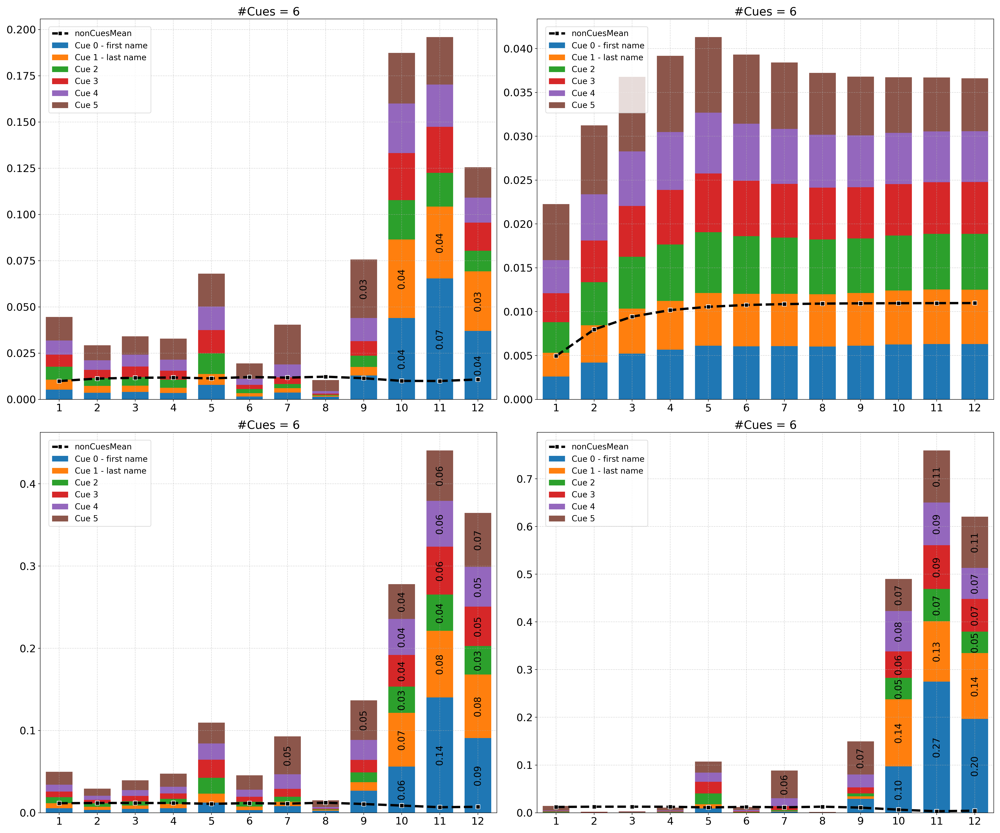

In [286]:
plot_cm(df_equal)

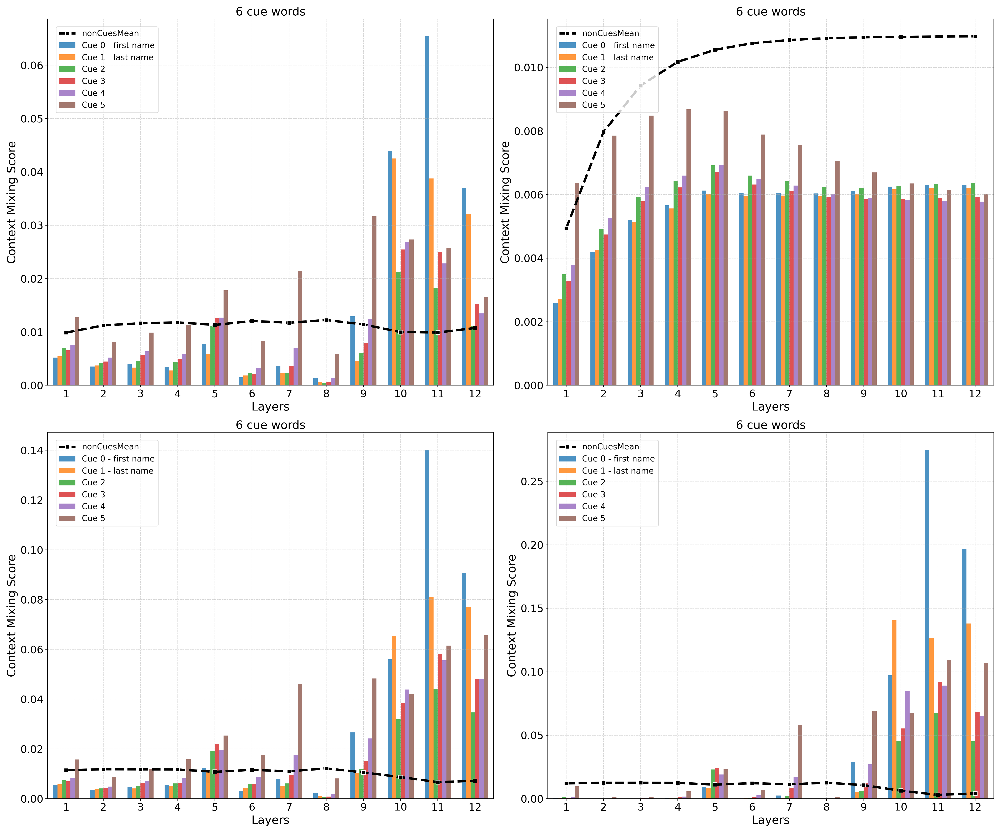

In [254]:
plot_cm3(df_equal)

### with fine-tuning

#### Examples with 2 cues

In [145]:
df = pd.read_pickle('../results_cm/finetuned-bert_gender_agreement_2.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  margaret becker is an american christian rock singer , guitarist , and songwriter . [MASK] has had twenty-one no. 1 christian radio hits , won four dove awards , and been nominated for four grammy awards .
CUE WORDS:  ['margaret|0|8', 'becker|9|15']
TARGET WORD:  she
MODEL PREDICTION:  she
DATAFRAME #ROWS:  190


In [146]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  186
ACCURACY:  97.89473684210527 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

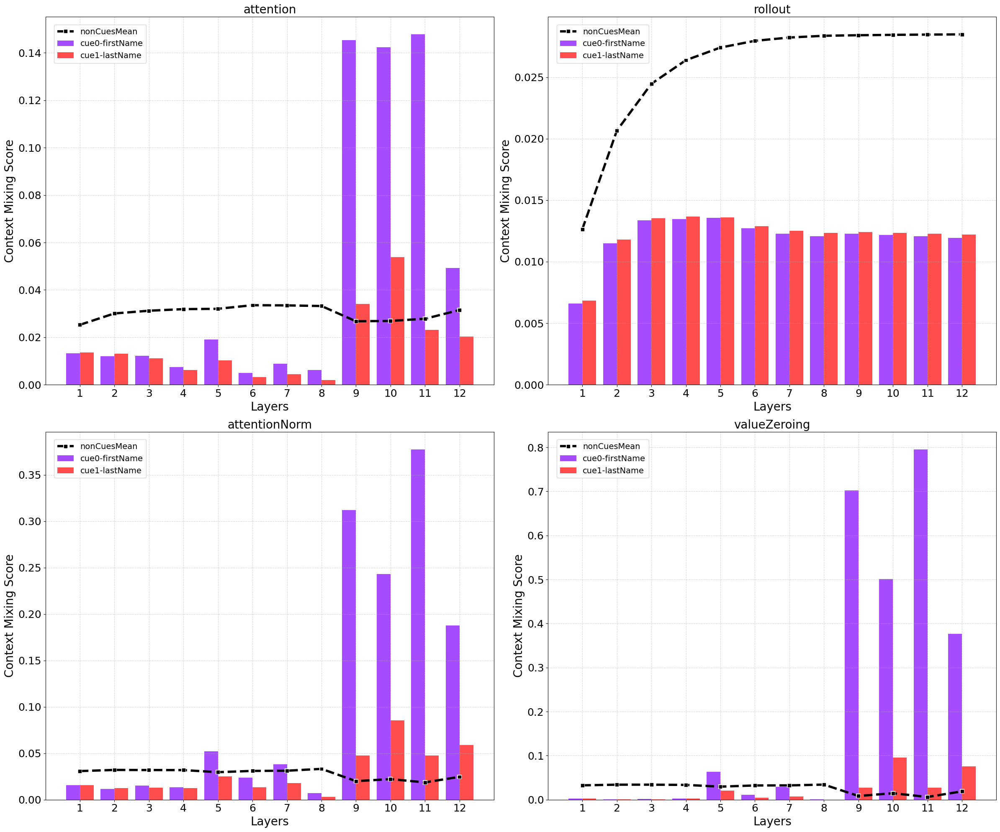

In [150]:
plot_cm(df_equal)

#### Examples with 4 cues

In [387]:
df = pd.read_pickle('../results_cm/finetuned-bert_gender_agreement_4.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  andy pyle is an english bass guitarist . he played with the kinks from 1976 -- 1978 . prior to that , he was in blodwyn pig and savoy brown . later , [MASK] played with wishbone ash .
CUE WORDS:  ['andy|0|4', 'pyle|5|9', 'he|41|43', 'he|102|104']
TARGET WORD:  he
MODEL PREDICTION:  he
DATAFRAME #ROWS:  193


In [369]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  190
ACCURACY:  98.44559585492227 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

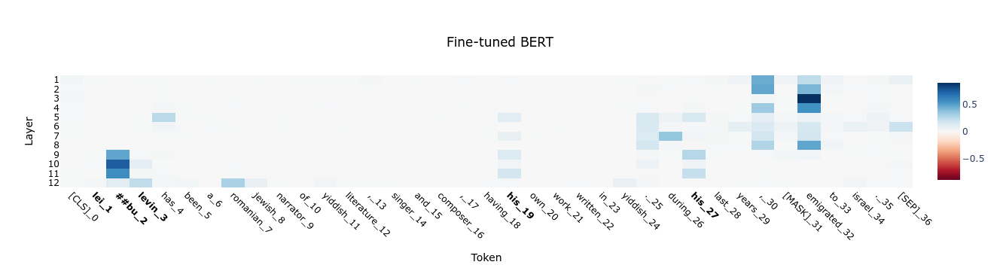

In [388]:
# plot a sample
for i in range(len(df)):
    if 'leibu levin' in df.iloc[i]['masked_text']:
        idx = i

tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')
token_labels = [f"{tokenizer.decode(token)}_{index}" for index, token in enumerate(df.iloc[idx]['input_ids'])]
bold_indices = [1, 2, 3, 19, 27] 
imshow(
    df.iloc[idx]['valueZeroing_cm_all_layers'], 
    x=token_labels,  # Changed from x to y
    xaxis="Token",  # Swapped xaxis and yaxis
    yaxis="Layer", 
    title="Fine-tuned BERT", 
    file_name="finetuned-BERT_cmSample.pdf",
    bold_indices=bold_indices
)

In [ ]:
plot_cm(df_equal)

#### Examples with 6 cues

In [370]:
df = pd.read_pickle('../results_cm/finetuned-bert_gender_agreement_6.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  marilyn livingstone is a scottish labour co-operative politician , who served as the member of the scottish parliament for kirkcaldy constituency from 1999-2011 . before her election in 1999 she was the head of the business school at fife college . she was also a councillor on kirkcaldy district council and fife council . she won re-election from the kirkcaldy constituency in the 2003 and 2007 elections , but lost [MASK] seat in the 2011 election to the scottish national party 's david torrance , by 182 votes .
CUE WORDS:  ['marilyn|0|7', 'livingstone|8|19', 'her|170|173', 'she|191|194', 'she|249|252', 'she|324|327']
TARGET WORD:  her
MODEL PREDICTION:  her
DATAFRAME #ROWS:  176


In [371]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  171
ACCURACY:  97.1590909090909 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'attentionNorm', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

In [ ]:
plot_cm(df_equal)

### Relative figure

In [ ]:
num_cues = 2

df_preTrained = pd.read_pickle(f'../results_cm/bert-base-uncased_gender_agreement_{num_cues}.pkl')
equality_condition = (df_preTrained['target_word'] == df_preTrained['model_top1_prediction'].astype(str).str.lower()) | (' '+df_preTrained['target_word'] == df_preTrained['model_top1_prediction'].astype(str).str.lower())
df_equal_preTrained = df_preTrained.loc[equality_condition]

df_fineTuned = pd.read_pickle(f'../results_cm/finetuned-bert_gender_agreement_{num_cues}.pkl')
equality_condition = (df_fineTuned['target_word'] == df_fineTuned['model_top1_prediction'].astype(str).str.lower()) | (' '+df_fineTuned['target_word'] == df_fineTuned['model_top1_prediction'].astype(str).str.lower())
df_equal_fineTuned = df_fineTuned.loc[equality_condition]

plot_relative(df_equal_preTrained, df_equal_fineTuned, 'BERT')

## Gemma-2b

### without fine-tuning

#### Examples with 2 cues

In [287]:
df = pd.read_pickle('../results_cm/gemma-2b_gender_agreement_2.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  margaret becker is an american christian rock singer , guitarist , and songwriter .
CUE WORDS:  ['margaret|0|8', 'becker|9|15']
TARGET WORD:  she
MODEL PREDICTION:   she
DATAFRAME #ROWS:  230


In [288]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  189
ACCURACY:  82.17391304347827 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

No data for attentionNorm


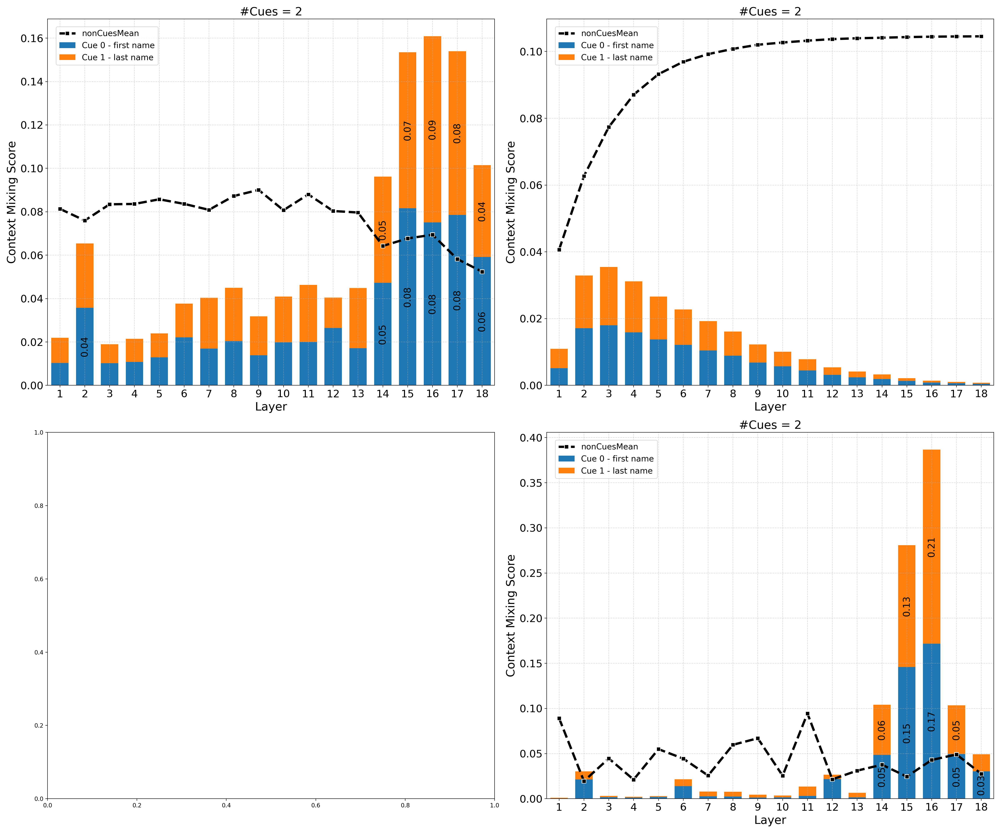

In [290]:
plot_cm(df_equal)

#### Examples with 4 cues

In [292]:
df = pd.read_pickle('../results_cm/gemma-2b_gender_agreement_4.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  andy pyle is an english bass guitarist . he played with the kinks from 1976 -- 1978 . prior to that , he was in blodwyn pig and savoy brown . later ,
CUE WORDS:  ['andy|0|4', 'pyle|5|9', 'he|41|43', 'he|102|104']
TARGET WORD:  he
MODEL PREDICTION:   he
DATAFRAME #ROWS:  235


In [293]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  167
ACCURACY:  71.06382978723404 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

No data for attentionNorm


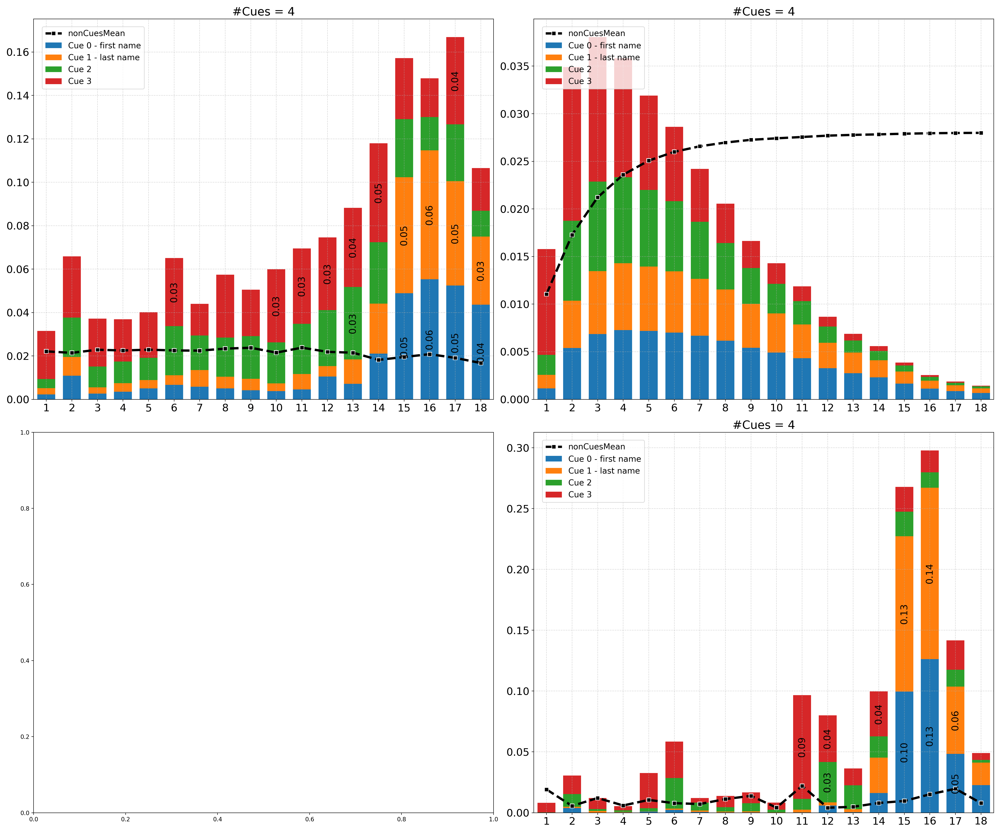

In [295]:
plot_cm(df_equal)

#### Examples with 6 cues

In [296]:
df = pd.read_pickle('../results_cm/gemma-2b_gender_agreement_6.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  marilyn livingstone is a scottish labour co-operative politician , who served as the member of the scottish parliament for kirkcaldy constituency from 1999-2011 . before her election in 1999 she was the head of the business school at fife college . she was also a councillor on kirkcaldy district council and fife council . she won re-election from the kirkcaldy constituency in the 2003 and 2007 elections , but lost
CUE WORDS:  ['marilyn|0|7', 'livingstone|8|19', 'her|170|173', 'she|191|194', 'she|249|252', 'she|324|327']
TARGET WORD:  her
MODEL PREDICTION:   her
DATAFRAME #ROWS:  226


In [297]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  143
ACCURACY:  63.27433628318584 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCueTarget_wmask_pos-1ords to the resulted dataframe
for cm in ['attention', 'rollout', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )
    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

No data for attentionNorm


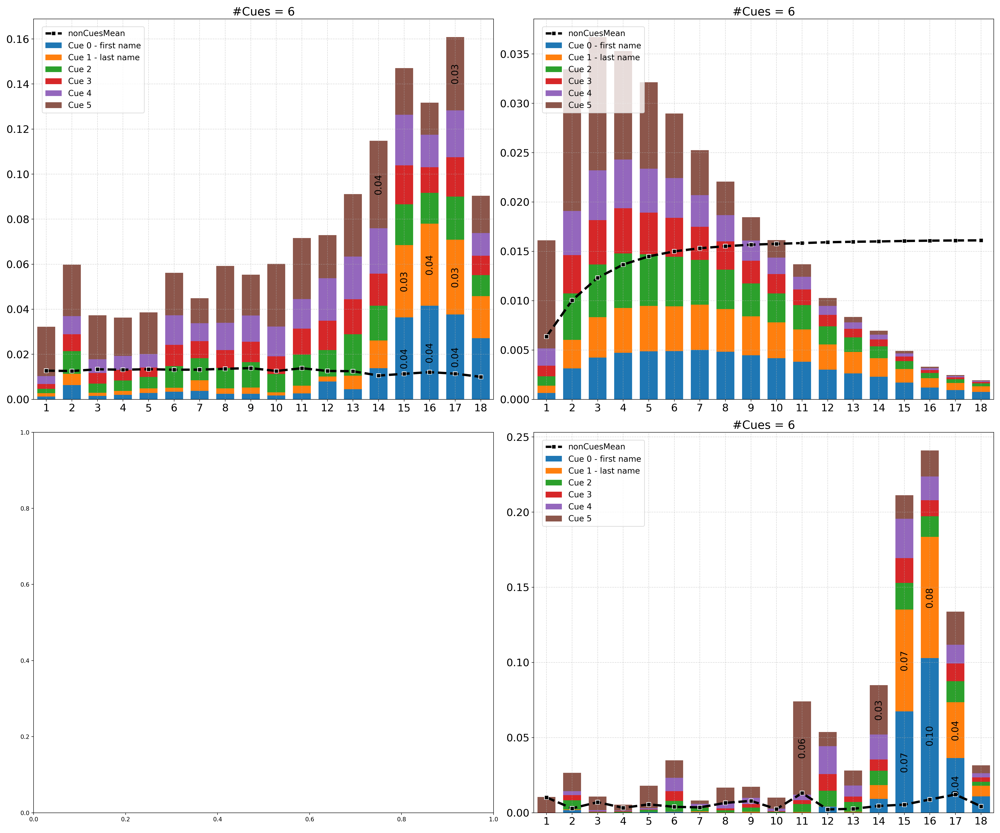

In [299]:
plot_cm(df_equal)

### Relative figure

In [ ]:
num_cues = 2

df_preTrained = pd.read_pickle(f'../results_cm/gemma-2b_gender_agreement_{num_cues}.pkl')
equality_condition = (df_preTrained['target_word'] == df_preTrained['model_top1_prediction'].astype(str).str.lower()) | (' '+df_preTrained['target_word'] == df_preTrained['model_top1_prediction'].astype(str).str.lower())
df_equal_preTrained = df_preTrained.loc[equality_condition]

plot_relative(df_equal_preTrained, None, 'Gemma-2b')

## GPT2

### without fine-tuning

#### Examples with 2 cues

In [300]:
df = pd.read_pickle('../results_cm/gpt2_gender_agreement_2.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  margaret becker is an american christian rock singer , guitarist , and songwriter .
CUE WORDS:  ['margaret|0|8', 'becker|9|15']
TARGET WORD:  she
MODEL PREDICTION:   He
DATAFRAME #ROWS:  124


In [301]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  91
ACCURACY:  73.38709677419355 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCue_words to the resulted dataframe
for cm in ['attention', 'rollout', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

No data for attentionNorm


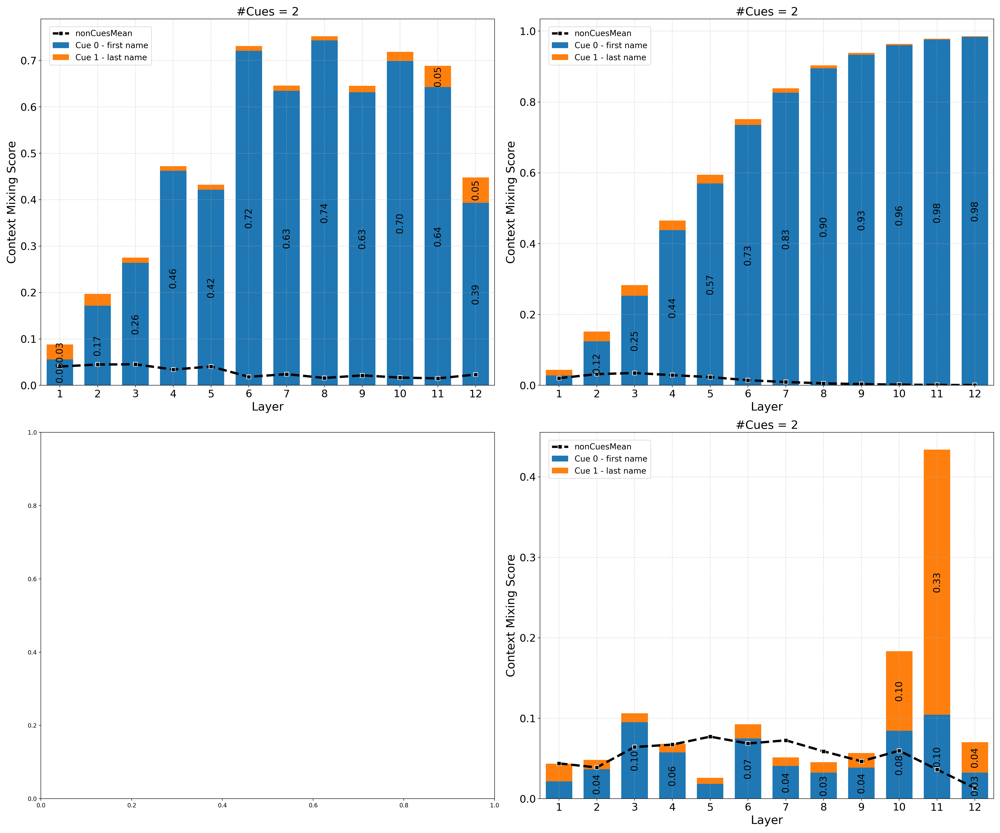

In [303]:
plot_cm(df_equal)

#### Examples with 4 cues

In [304]:
df = pd.read_pickle('../results_cm/gpt2_gender_agreement_4.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  andy pyle is an english bass guitarist . he played with the kinks from 1976 -- 1978 . prior to that , he was in blodwyn pig and savoy brown . later ,
CUE WORDS:  ['andy|0|4', 'pyle|5|9', 'he|41|43', 'he|102|104']
TARGET WORD:  he
MODEL PREDICTION:   he
DATAFRAME #ROWS:  123


In [305]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  83
ACCURACY:  67.47967479674797 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCue_words to the resulted dataframe
for cm in ['attention', 'rollout', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

No data for attentionNorm


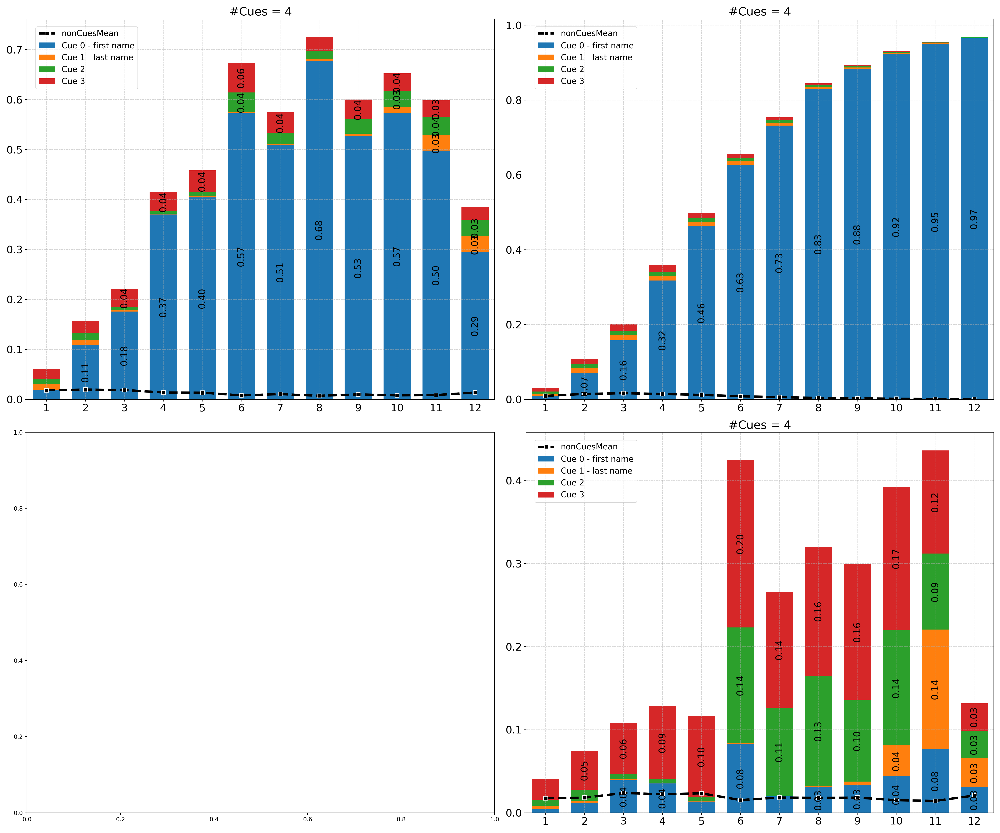

In [307]:
plot_cm(df_equal)

#### Examples with 6 cues

In [308]:
df = pd.read_pickle('../results_cm/gpt2_gender_agreement_6.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  gary hughes is an english hard rock singer , songwriter and musician . apart from his work as a solo artist , gary hughes is the front man and main songwriter of hard rock/melodic rock band ten .
CUE WORDS:  ['gary|0|4', 'hughes|5|11', 'his|82|85', 'gary|110|114', 'hughes|115|121', 'man|135|138']
TARGET WORD:  he
MODEL PREDICTION:   he
DATAFRAME #ROWS:  110


In [309]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  65
ACCURACY:  59.09090909090909 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCue_words to the resulted dataframe
for cm in ['attention', 'rollout', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

No data for attentionNorm


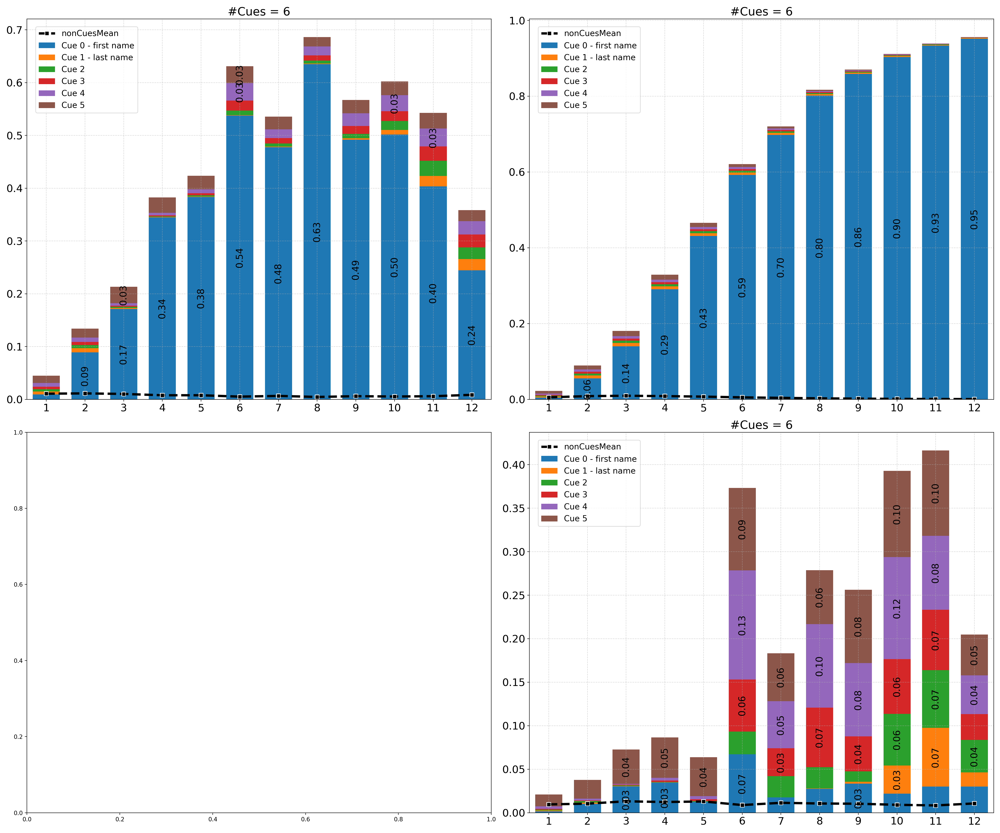

In [315]:
plot_cm(df_equal)

### with fine-tuning

#### Examples with 2 cues

In [316]:
df = pd.read_pickle('../results_cm/finetuned-gpt2_gender_agreement_2.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  margaret becker is an american christian rock singer , guitarist , and songwriter .
CUE WORDS:  ['margaret|0|8', 'becker|9|15']
TARGET WORD:  she
MODEL PREDICTION:   She
DATAFRAME #ROWS:  124


In [317]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  97
ACCURACY:  78.2258064516129 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCue_words to the resulted dataframe
for cm in ['attention', 'rollout', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

No data for attentionNorm


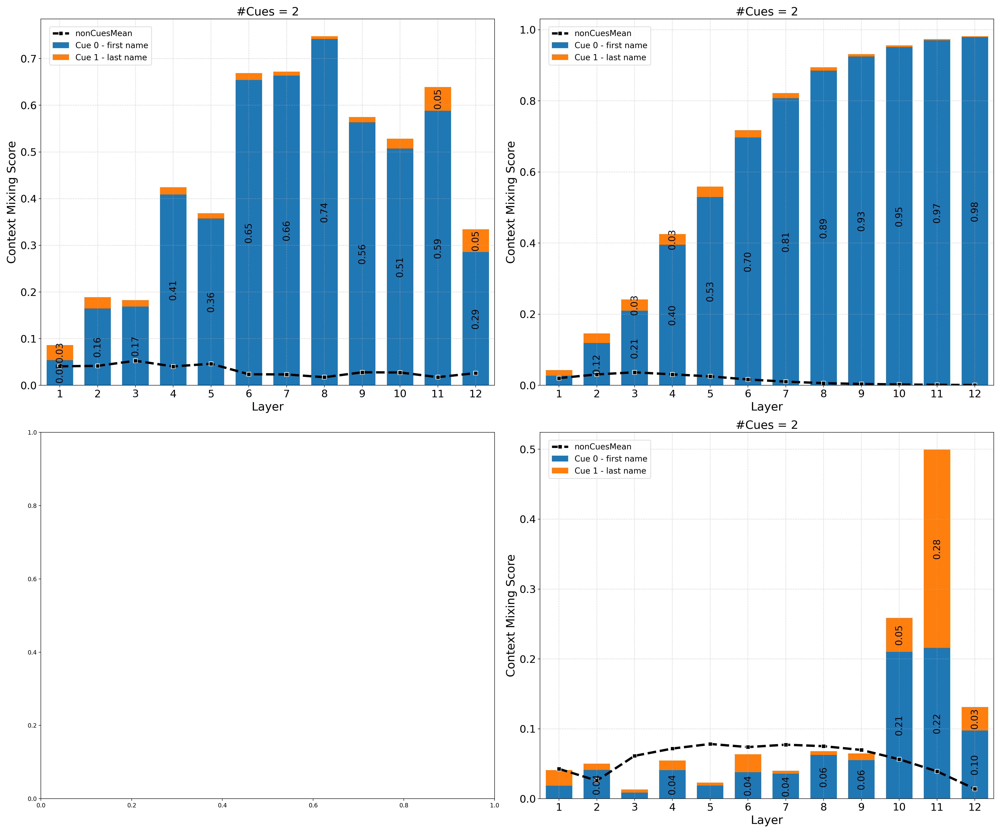

In [319]:
plot_cm(df_equal)

#### Examples with 4 cues

In [389]:
df = pd.read_pickle('../results_cm/finetuned-gpt2_gender_agreement_4.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  andy pyle is an english bass guitarist . he played with the kinks from 1976 -- 1978 . prior to that , he was in blodwyn pig and savoy brown . later ,
CUE WORDS:  ['andy|0|4', 'pyle|5|9', 'he|41|43', 'he|102|104']
TARGET WORD:  he
MODEL PREDICTION:   he
DATAFRAME #ROWS:  123


In [321]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  105
ACCURACY:  85.36585365853658 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCue_words to the resulted dataframe
for cm in ['attention', 'rollout', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

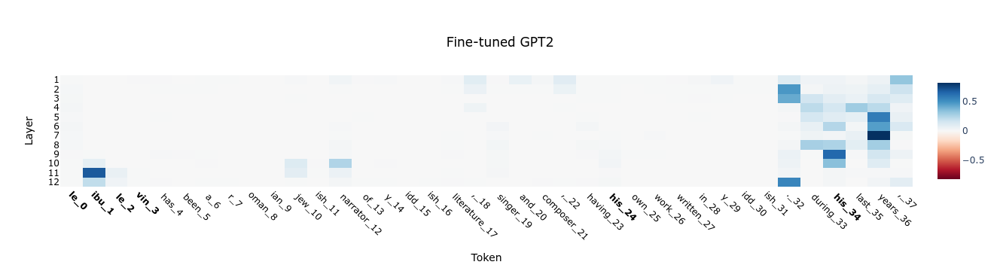

In [390]:
# plot a sample
for i in range(len(df)):
    if 'leibu levin' in df.iloc[i]['masked_text']:
        idx = i

tokenizer = AutoTokenizer.from_pretrained('gpt2')
token_labels = [f"{tokenizer.decode(token)}_{index}" for index, token in enumerate(df.iloc[idx]['input_ids'])]
bold_indices = [0, 1, 2, 3, 24, 34] 
imshow(
    df.iloc[idx]['valueZeroing_cm_all_layers'], 
    x=token_labels,  # Changed from x to y
    xaxis="Token",  # Swapped xaxis and yaxis
    yaxis="Layer", 
    title="Fine-tuned GPT2", 
    file_name="finetuned-GPT2_cmSample.pdf",
    bold_indices=bold_indices
)

No data for attentionNorm


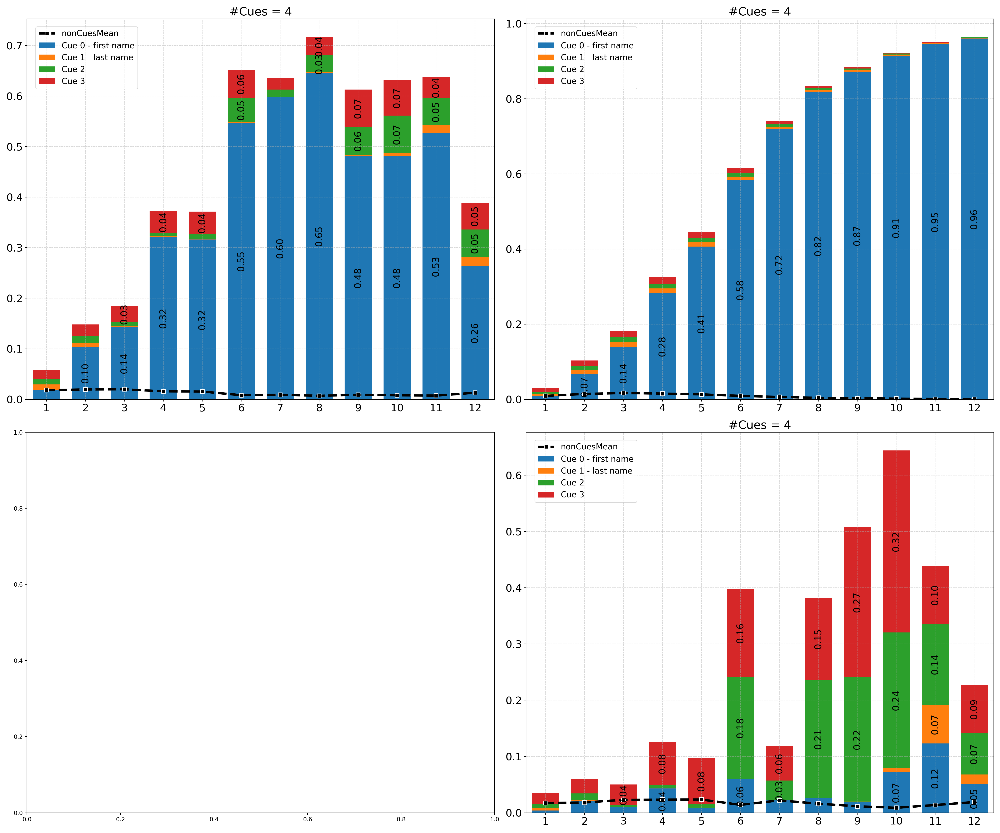

In [323]:
plot_cm(df_equal)

#### Examples with 6 cues

In [324]:
df = pd.read_pickle('../results_cm/finetuned-gpt2_gender_agreement_6.pkl')
print('MASKED TEXT: ', df.iloc[0]['masked_text'])
print('CUE WORDS: ', df.iloc[0]['cue_words'])
print('TARGET WORD: ', df.iloc[0]['target_word'])
print('MODEL PREDICTION: ', df.iloc[0]['model_top1_prediction'])
print('DATAFRAME #ROWS: ', df.shape[0])

MASKED TEXT:  gary hughes is an english hard rock singer , songwriter and musician . apart from his work as a solo artist , gary hughes is the front man and main songwriter of hard rock/melodic rock band ten .
CUE WORDS:  ['gary|0|4', 'hughes|5|11', 'his|82|85', 'gary|110|114', 'hughes|115|121', 'man|135|138']
TARGET WORD:  he
MODEL PREDICTION:   He
DATAFRAME #ROWS:  110


In [325]:
# investigating examples with correct model prediction
equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
df_equal = df.loc[equality_condition]
print('DATAFRAME #ROWS: ', df_equal.shape[0])
print('ACCURACY: ', df_equal.shape[0]/df.shape[0] * 100, '%')

DATAFRAME #ROWS:  77
ACCURACY:  70.0 %


In [ ]:
# add cue_words cm and also mean and max cm of nonCue_words to the resulted dataframe
for cm in ['attention', 'rollout', 'valueZeroing']:
    df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
        lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
        axis=1
    )

    df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
        lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
        axis=1
    )

No data for attentionNorm


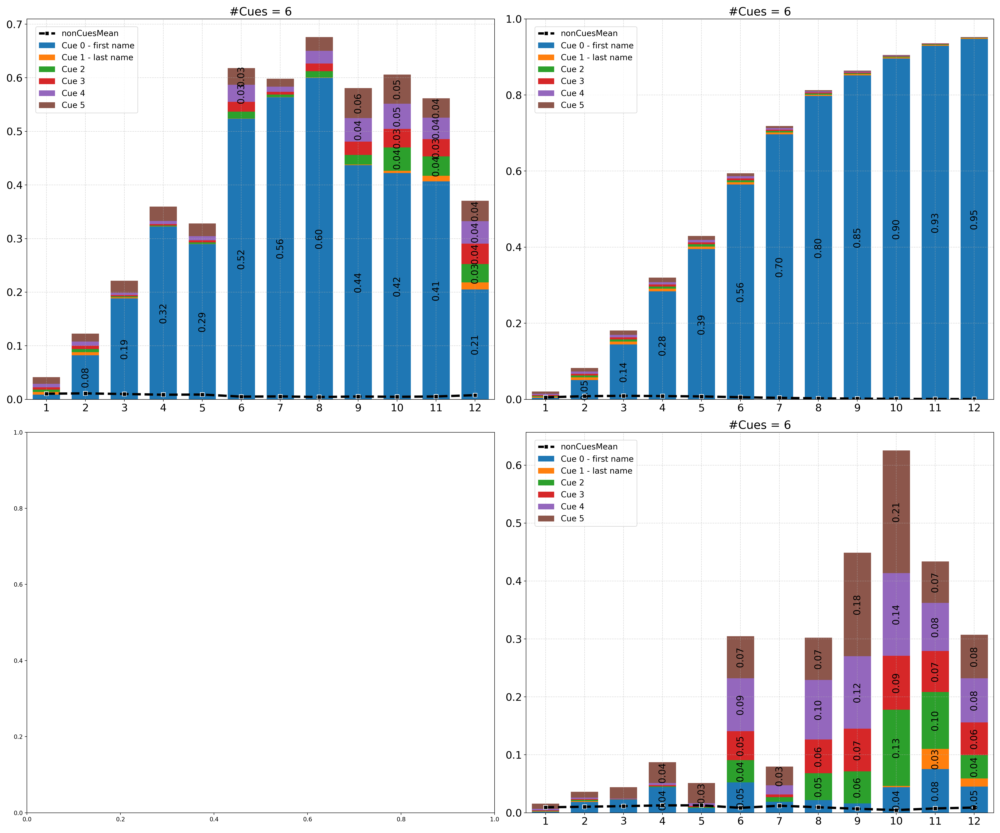

In [327]:
plot_cm(df_equal)

### Releative figure

In [ ]:
num_cues = 2

df_preTrained = pd.read_pickle(f'../results_cm/gpt2_gender_agreement_{num_cues}.pkl')
equality_condition = (df_preTrained['target_word'] == df_preTrained['model_top1_prediction'].astype(str).str.lower()) | (' '+df_preTrained['target_word'] == df_preTrained['model_top1_prediction'].astype(str).str.lower())
df_equal_preTrained = df_preTrained.loc[equality_condition]

df_fineTuned = pd.read_pickle(f'../results_cm/finetuned-gpt2_gender_agreement_{num_cues}.pkl')
equality_condition = (df_fineTuned['target_word'] == df_fineTuned['model_top1_prediction'].astype(str).str.lower()) | (' '+df_fineTuned['target_word'] == df_fineTuned['model_top1_prediction'].astype(str).str.lower())
df_equal_fineTuned = df_fineTuned.loc[equality_condition]

plot_relative(df_equal_preTrained, df_equal_fineTuned, 'GPT2')

____

# Save all cm figures

In [ ]:
ABLATION = True

for c in tqdm(range(2,7)):
    # for model in ['gpt2']:
    for model in ['bert-base-uncased', 'finetuned-bert', 'gpt2', 'finetuned-gpt2', 'roberta-base', 'finetuned-roberta', 'gemma-2b']:
        if model in ['roberta-base', 'finetuned-roberta', 'bert-base-uncased', 'finetuned-bert']:
            applicable_cm_methods = ['attention', 'rollout', 'attentionNorm', 'valueZeroing']
        else:
            applicable_cm_methods = ['attention', 'rollout', 'valueZeroing']

        df_dir = f'../results_cm/{model}_gender_agreement_{c}.pkl' if not ABLATION else f'../results_cm/ablation/{model}_gender_agreement_{c}.pkl'
        df = pd.read_pickle(df_dir)
        
        equality_condition = (df['target_word'] == df['model_top1_prediction'].astype(str).str.lower()) | (' '+df['target_word'] == df['model_top1_prediction'].astype(str).str.lower())
        df_equal = df.loc[equality_condition]
        
        # add cue_words cm and also mean and max cm of nonCue tokens to the resulted dataframe
        for cm in applicable_cm_methods:
            df_equal[f'{cm}_CueWordsCm_all_layers'] = df_equal.apply(
                lambda row: extract_cueWords_cm(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes']), 
                axis=1
            )
        
            df_equal[f'{cm}_nonCueWordsCm_mean_all_layers'] = df_equal.apply(
                lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'mean', row['pos4pred']), 
                axis=1
            )
        
            df_equal[f'{cm}_nonCueWordsCm_max_all_layers'] = df_equal.apply(
                lambda row: extract_nonCueWords_stats(row[f'{cm}_cm_all_layers'], row['cues_tokenIdxes'], 'max', row['pos4pred']), 
                axis=1
            )
        # clear_output()
        save_dir = '../figs/all_cms_figs' if not ABLATION else '../figs/all_cms_figs/ablation'
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)    
            
        # save thes figures to the pdf format
        for column in applicable_cm_methods:
            plot_cm(df_equal, columns=[column], filename= save_dir + f'/{model}_{column}_{c}.pdf', save_legend=True, ablation=ABLATION)

  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]/tmp/ipykernel_361134/2668858202.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_361134/2668858202.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_361134/2668858202.py:29: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 